# Phoenix Global Employee Attrition Rate Analysis


### Problem Statement:

Phoenix Global has been facing the issue of constant employee attrition Close to 15 % of its employees leave the company and
need to be replaced with the talent pool available in the job market The management believes that this level of attrition is bad for the company.

Hence, the leadership team has employed a special HR analytics team to understand what factors they should focus on, in order
to curb attrition In other words, they want to know what changes they should make to their workplace, in order to get most of
their employees to stay Also, they want to know which of these variables is most important and needs to be addressed right
away.

### Objective

You are required to model the probability of attrition. The results obtained will help management understand what workplace changes are necessary to retain most of their employees.

# Import Libraries

In [1390]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)
import warnings
warnings.filterwarnings('ignore')

In [1392]:
from sklearn.metrics import accuracy_score, recall_score, f1_score, precision_score
from sklearn import metrics

# Importing Data

#### Employee Survey Data

In [1396]:
df_employee_survey = pd.read_csv(r"C:\Users\Lenovo\Downloads\employee_survey_data.csv")

In [1398]:
df_employee_survey

,EmployeeID,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance
0,1,3.0,4.0,2.0
1,2,3.0,2.0,4.0
2,3,2.0,2.0,1.0
3,4,4.0,4.0,3.0
4,5,4.0,1.0,3.0
...,...,...,...,...
4405,4406,4.0,1.0,3.0
4406,4407,4.0,4.0,3.0
4407,4408,1.0,3.0,3.0
4408,4409,4.0,1.0,3.0


In [1402]:
df_employee_survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   EmployeeID               4410 non-null   int64  
 1   EnvironmentSatisfaction  4385 non-null   float64
 2   JobSatisfaction          4390 non-null   float64
 3   WorkLifeBalance          4372 non-null   float64
dtypes: float64(3), int64(1)
memory usage: 137.9 KB


In [1404]:
df_employee_survey.describe()

,EmployeeID,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance
count,4410.000000,4385.000000,4390.000000,4372.000000
mean,2205.500000,2.723603,2.728246,2.761436
std,1273.201673,1.092756,1.101253,0.706245
min,1.000000,1.000000,1.000000,1.000000
25%,1103.250000,2.000000,2.000000,2.000000
50%,2205.500000,3.000000,3.000000,3.000000
75%,3307.750000,4.000000,4.000000,3.000000
max,4410.000000,4.000000,4.000000,4.000000


In [1406]:
df_employee_survey.isnull().sum()

EmployeeID                  0
EnvironmentSatisfaction    25
JobSatisfaction            20
WorkLifeBalance            38
dtype: int64

In [1408]:
# List of columns to get value counts for
c_var = ['EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance']

for col in c_var:
    print(f"Value counts for {col}:")
    print(df_employee_survey[col].value_counts(dropna=False))
    print("\n")

Value counts for EnvironmentSatisfaction:
EnvironmentSatisfaction
3.0    1350
4.0    1334
2.0     856
1.0     845
NaN      25
Name: count, dtype: int64


Value counts for JobSatisfaction:
JobSatisfaction
4.0    1367
3.0    1323
1.0     860
2.0     840
NaN      20
Name: count, dtype: int64


Value counts for WorkLifeBalance:
WorkLifeBalance
3.0    2660
2.0    1019
4.0     454
1.0     239
NaN      38
Name: count, dtype: int64




In [1410]:
skewness = df_employee_survey[['EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance']].skew()

print("Skewness of columns:")
print(skewness)

Skewness of columns:
EnvironmentSatisfaction   -0.323295
JobSatisfaction           -0.328622
WorkLifeBalance           -0.557041
dtype: float64


Environment Satisfaction
- Skewness: -0.323
- Interpretation: The negative skewness indicates that the distribution of Environment Satisfaction is slightly left-skewed. This means that most employees rate their environment satisfaction relatively high, with fewer employees giving lower ratings.

Job Satisfaction
- Skewness: -0.329
- Interpretation: Similar to Environment Satisfaction, Job Satisfaction is also slightly left-skewed. Most employees tend to be satisfied with their jobs, with a smaller number of employees expressing dissatisfaction.

Work-Life Balance
- Skewness: -0.557
- Interpretation: Work-Life Balance has a more pronounced left skew compared to the other two variables. This might suggests that a larger proportion of employees report a good work-life balance, while fewer employees feel they have poor work-life balance.

## Imputing NaN values with Mode

In [1413]:
# Calculate mode (most frequent value)
mode1 = df_employee_survey['JobSatisfaction'].mode()[0]
mode2 = df_employee_survey['EnvironmentSatisfaction'].mode()[0]
mode3 = df_employee_survey['WorkLifeBalance'].mode()[0]

# Impute missing values with mode
df_employee_survey['JobSatisfaction'].fillna(mode1, inplace=True)
df_employee_survey['EnvironmentSatisfaction'].fillna(mode2, inplace=True)
df_employee_survey['WorkLifeBalance'].fillna(mode3, inplace=True)


In [1415]:
df_employee_survey.isnull().sum()

EmployeeID                 0
EnvironmentSatisfaction    0
JobSatisfaction            0
WorkLifeBalance            0
dtype: int64

In [1417]:
skewness = df_employee_survey[['EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance']].skew()

print("Skewness of columns:")
print(skewness)

Skewness of columns:
EnvironmentSatisfaction   -0.328260
JobSatisfaction           -0.335137
WorkLifeBalance           -0.567064
dtype: float64


There's no significant change in data distribution after Imputation

## Manager Survey Data

In [1420]:
df_manager_survey = pd.read_csv(r"C:\Users\Lenovo\Downloads\manager_survey_data.csv")

In [1422]:
df_manager_survey

,EmployeeID,JobInvolvement,PerformanceRating
0,1,3,3
1,2,2,4
2,3,3,3
3,4,2,3
4,5,3,3
...,...,...,...
4405,4406,3,3
4406,4407,2,3
4407,4408,3,4
4408,4409,2,3


In [1424]:
df_manager_survey.isnull().sum()

EmployeeID           0
JobInvolvement       0
PerformanceRating    0
dtype: int64

In [1426]:
s2 = df_manager_survey[['JobInvolvement', 'PerformanceRating']].skew()

print("Skewness of columns:")
print(s2)

Skewness of columns:
JobInvolvement      -0.498080
PerformanceRating    1.920574
dtype: float64


Job Involvement
- Skewness: -0.498
- Interpretation: The negative skewness indicates that the distribution of Job Involvement is <u>moderately left-skewed</u>. This suggests that most employees have high job involvement, with fewer employees having lower levels of job involvement.

Performance Rating
- Skewness: 1.921
- Interpretation: The positive skewness indicates that the distribution of Performance Ratings is <u>highly right-skewed</u>. he right skewness in Performance Ratings indicates that most employees have average or below-average performance ratings, with a few outliers having high ratings.

In [1429]:
df_manager_survey['PerformanceRating'].value_counts()

PerformanceRating
3    3732
4     678
Name: count, dtype: int64

Since Performance Rating is highly skewed, it might not provide much variability for the model to learn from. Most of the information comes from employees with a rating of 3, which could overshadow the impact of the minority class (rating 4).

Techniques like One Hot Encoding or Synthetic Data Generation can be used, to reduce skewness.

In [1432]:
df_manager_survey['JobInvolvement'].value_counts()

JobInvolvement
3    2604
2    1125
4     432
1     249
Name: count, dtype: int64

#### General Data


In [1434]:
df_general = pd.read_csv(r"C:\Users\Lenovo\Downloads\general_data.csv")

In [1436]:
df_general

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,No,Travel_Rarely,Sales,6,2,Life Sciences,1,1,Female,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,Yes,Travel_Frequently,Research & Development,10,1,Life Sciences,1,2,Female,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,No,Travel_Frequently,Research & Development,17,4,Other,1,3,Male,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,No,Non-Travel,Research & Development,2,5,Life Sciences,1,4,Male,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,No,Travel_Rarely,Research & Development,10,1,Medical,1,5,Male,...,4.0,Y,12,8,2,9.0,2,6,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,42,No,Travel_Rarely,Research & Development,5,4,Medical,1,4406,Female,...,3.0,Y,17,8,1,10.0,5,3,0,2
4406,29,No,Travel_Rarely,Research & Development,2,4,Medical,1,4407,Male,...,2.0,Y,15,8,0,10.0,2,3,0,2
4407,25,No,Travel_Rarely,Research & Development,25,2,Life Sciences,1,4408,Male,...,0.0,Y,20,8,0,5.0,4,4,1,2
4408,42,No,Travel_Rarely,Sales,18,2,Medical,1,4409,Male,...,0.0,Y,14,8,1,10.0,2,9,7,8


In [1438]:
df_general.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeID                  0
Gender                      0
JobLevel                    0
JobRole                     0
MaritalStatus               0
MonthlyIncome               0
NumCompaniesWorked         19
Over18                      0
PercentSalaryHike           0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           9
TrainingTimesLastYear       0
YearsAtCompany              0
YearsSinceLastPromotion     0
YearsWithCurrManager        0
dtype: int64

In [1440]:
df_general['NumCompaniesWorked'].value_counts()

NumCompaniesWorked
1.0    1558
0.0     586
3.0     474
2.0     438
4.0     415
7.0     222
6.0     208
5.0     187
9.0     156
8.0     147
Name: count, dtype: int64

In [1442]:
df_general['NumCompaniesWorked'].skew()

1.0267666759708942

In [1444]:
m = df_general['NumCompaniesWorked'].mode()[0]

# Impute missing values with mode
df_general['NumCompaniesWorked'].fillna(m, inplace=True)

In [1446]:
df_general['NumCompaniesWorked'].skew()

1.0333628369693353

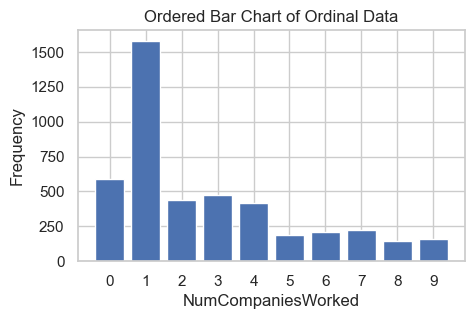

In [1450]:
value_counts = df_general['NumCompaniesWorked'].value_counts()

# Plotting ordered bar chart
plt.figure(figsize=(5, 3))  # Adjust figure size as needed
plt.bar(value_counts.index, value_counts.values)
plt.xlabel('NumCompaniesWorked')
plt.ylabel('Frequency')
plt.title('Ordered Bar Chart of Ordinal Data')
plt.xticks(value_counts.index)  # Ensure x-axis ticks match the index values
plt.show()

# Merging the all the files

In [1592]:
df = pd.merge(df_employee_survey, df_general, how='inner', on='EmployeeID')
df = pd.merge(df_manager_survey, df, how='inner', on='EmployeeID')


In [1594]:
df.head()

,EmployeeID,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,BusinessTravel,Department,...,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,1,3,3,3.0,4.0,2.0,51,No,Travel_Rarely,Sales,...,1.0,Y,11,8,0,1.0,6,1,0,0
1,2,2,4,3.0,2.0,4.0,31,Yes,Travel_Frequently,Research & Development,...,0.0,Y,23,8,1,6.0,3,5,1,4
2,3,3,3,2.0,2.0,1.0,32,No,Travel_Frequently,Research & Development,...,1.0,Y,15,8,3,5.0,2,5,0,3
3,4,2,3,4.0,4.0,3.0,38,No,Non-Travel,Research & Development,...,3.0,Y,11,8,3,13.0,5,8,7,5
4,5,3,3,4.0,1.0,3.0,32,No,Travel_Rarely,Research & Development,...,4.0,Y,12,8,2,9.0,2,6,0,4


In [1456]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 29 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   EmployeeID               4410 non-null   int64  
 1   JobInvolvement           4410 non-null   int64  
 2   PerformanceRating        4410 non-null   int64  
 3   EnvironmentSatisfaction  4410 non-null   float64
 4   JobSatisfaction          4410 non-null   float64
 5   WorkLifeBalance          4410 non-null   float64
 6   Age                      4410 non-null   int64  
 7   Attrition                4410 non-null   object 
 8   BusinessTravel           4410 non-null   object 
 9   Department               4410 non-null   object 
 10  DistanceFromHome         4410 non-null   int64  
 11  Education                4410 non-null   int64  
 12  EducationField           4410 non-null   object 
 13  EmployeeCount            4410 non-null   int64  
 14  Gender                  

# Data Preprocessing

In [855]:
df.columns

Index(['EmployeeID', 'JobInvolvement', 'PerformanceRating',
       'EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance', 'Age',
       'Attrition', 'BusinessTravel', 'Department', 'DistanceFromHome',
       'Education', 'EducationField', 'EmployeeCount', 'Gender', 'JobLevel',
       'JobRole', 'MaritalStatus', 'MonthlyIncome', 'NumCompaniesWorked',
       'Over18', 'PercentSalaryHike', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

### Basic EDA of  final dataset

In [857]:
df.shape

(4410, 29)

In [896]:
df.describe()

,EmployeeID,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,DistanceFromHome,Education,EmployeeCount,JobLevel,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
count,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.0,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000,4410.000000
mean,2205.500000,2.729932,3.153741,2.725170,2.734014,2.763492,36.923810,9.192517,2.912925,1.0,2.063946,65029.312925,2.687528,15.209524,0.793878,2.799320,7.008163,2.187755,4.123129
std,1273.201673,0.711400,0.360742,1.089852,1.102071,0.703541,9.133301,8.105026,1.023933,0.0,1.106689,47068.888559,2.495967,3.659108,0.851883,1.288978,6.125135,3.221699,3.567327
min,1.000000,1.000000,3.000000,1.000000,1.000000,1.000000,18.000000,1.000000,1.000000,1.0,1.000000,10090.000000,0.000000,11.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1103.250000,2.000000,3.000000,2.000000,2.000000,2.000000,30.000000,2.000000,2.000000,1.0,1.000000,29110.000000,1.000000,12.000000,0.000000,2.000000,3.000000,0.000000,2.000000
50%,2205.500000,3.000000,3.000000,3.000000,3.000000,3.000000,36.000000,7.000000,3.000000,1.0,2.000000,49190.000000,2.000000,14.000000,1.000000,3.000000,5.000000,1.000000,3.000000
75%,3307.750000,3.000000,3.000000,4.000000,4.000000,3.000000,43.000000,14.000000,4.000000,1.0,3.000000,83800.000000,4.000000,18.000000,1.000000,3.000000,9.000000,3.000000,7.000000
max,4410.000000,4.000000,4.000000,4.000000,4.000000,4.000000,60.000000,29.000000,5.000000,1.0,5.000000,199990.000000,9.000000,25.000000,3.000000,6.000000,40.000000,15.000000,17.000000


Most of the columns are Ordinal in nature.

Monthly income: 75% of the people earn less than 83800. The max salary is 199990

PercentageSalaryHike: 75% of the people have got less than 18% hike in salary, Therefore 25% of employees have got 18% -25% hike

Age: Less than 50% of employees are of age 18-36

Distance from Home (kms):25% employees home is more than 14km away from the office.

In [889]:
df["Attrition"].value_counts()/len(df)*100

Attrition
No     83.877551
Yes    16.122449
Name: count, dtype: float64

<b>Attrition Rate of the company is 16%</b>

Our Target variable : "Attrition" is highly imbalanced, Ratio - 84:16

In [1596]:
df_bck=df.copy()  # backup data

#### Dropping Columns which are not significant

In [1598]:
df.drop(columns=['Over18',"StandardHours","TotalWorkingYears","EmployeeCount"], inplace=True)

### Descriptive statistics for categorical variables

In [1466]:
df.describe(include="O")

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus
count,4410,4410,4410,4410,4410,4410,4410
unique,2,3,3,6,2,9,3
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married
freq,3699,3129,2883,1818,2646,978,2019


#### Gender

In [901]:
df["Gender"].value_counts()/len(df)*100

Gender
Male      60.0
Female    40.0
Name: count, dtype: float64

Male and Female employee ratio is 60:40

In [965]:
grouped = df.groupby(['Gender', 'Attrition']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)

print(percentage)

Attrition     No    Yes
Gender                 
Female     84.69  15.31
Male       83.33  16.67


There is not significant difference in the Attrition rate with respect to Gender 

#### Department

In [904]:
df["Department"].value_counts()/len(df)*100

Department
Research & Development    65.374150
Sales                     30.340136
Human Resources            4.285714
Name: count, dtype: float64

<b>65%</b> of the employees are in Research and Development Department, followed by Sales dept with 30% employees.Only 4% of the employees are in the HR department.

In [939]:
grouped = df.groupby(['Department', 'Attrition']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)

print(percentage)

Attrition                  No    Yes
Department                          
Human Resources         69.84  30.16
Research & Development  84.29  15.71
Sales                   84.98  15.02


<b>30%</b> of the employees from HR department have churned out last year, HR department is the department with only 4% of the total employees.

Filtering the DataFrame where Attrition = Yes

In [2562]:
df_att = df[df['Attrition'] == 'Yes']
df_att.sample(3)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,YearsWorked_Bins,Age_Bins,MonthlyIncome_log
580,1,3,3.0,1.0,2.0,42,Yes,Travel_Frequently,Sales,2,...,0.0,16,0,3,21,13,14,20 - 25,39 - 46,10.036750
4154,3,3,4.0,3.0,3.0,37,Yes,Travel_Rarely,Research & Development,2,...,6.0,19,0,2,0,0,0,NaN,32 - 39,10.941483
965,3,3,3.0,3.0,1.0,47,Yes,Travel_Frequently,Research & Development,1,...,7.0,11,2,1,23,14,10,20 - 25,46 - 53,12.187252


In [2566]:
from IPython.display import display

In [2568]:
grouped = df_att.groupby(['Department', 'JobRole']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)
display(percentage)


JobRole,Healthcare Representative,Human Resources,Laboratory Technician,Manager,Manufacturing Director,Research Director,Research Scientist,Sales Executive,Sales Representative
Department,,,,,,,,,
Human Resources,5.26,NaN,31.58,5.26,10.53,NaN,5.26,42.11,NaN
Research & Development,4.64,3.97,15.89,5.30,7.95,9.27,21.85,24.50,6.62
Sales,16.42,1.49,17.91,7.46,2.99,7.46,28.36,14.93,2.99


- Within HR department( have highest attrition rate), Job role of  Sales Excecutive( 42%)  and also Laboratory Technician (31%) have the Highest attritions.
- Research Scientist (21%) and Sales Excecutive (24%) Job Roles have the high attrition rate in Research and development department
- Research Scientist (28%) the high attrition rate in Sales department

#### BusinessTravel

In [908]:
df["BusinessTravel"].value_counts()/len(df)*100

BusinessTravel
Travel_Rarely        70.952381
Travel_Frequently    18.843537
Non-Travel           10.204082
Name: count, dtype: float64

In [923]:
grouped = df.groupby(['BusinessTravel', 'Attrition']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)

print(percentage)

Attrition             No    Yes
BusinessTravel                 
Non-Travel         92.00   8.00
Travel_Frequently  75.09  24.91
Travel_Rarely      85.04  14.96


18% of the Employee have to travel frequently. And out of these employees <b>24%</b> of the employees have Churned out last year, <u>which is 10% higher</u> than employees who Travel Rarely for business (<b>14%</b> Attrition rate)

#### EducationField

In [945]:
df["EducationField"].value_counts()/len(df)*100

EducationField
Life Sciences       41.224490
Medical             31.564626
Marketing           10.816327
Technical Degree     8.979592
Other                5.578231
Human Resources      1.836735
Name: count, dtype: float64

41% of the total employees have education in Life Science

In [947]:
grouped = df.groupby(['EducationField', 'Attrition']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)

print(percentage)

Attrition            No    Yes
EducationField                
Human Resources   59.26  40.74
Life Sciences     83.33  16.67
Marketing         84.28  15.72
Medical           83.84  16.16
Other             87.80  12.20
Technical Degree  88.64  11.36


Employees with education background in Human Resources,their attrition rate is of 40% , highest among other EductaionField.

#### JobRole	

In [959]:
df["JobRole"].value_counts()/len(df)*100

JobRole
Sales Executive              22.176871
Research Scientist           19.863946
Laboratory Technician        17.619048
Manufacturing Director        9.863946
Healthcare Representative     8.911565
Manager                       6.938776
Sales Representative          5.646259
Research Director             5.442177
Human Resources               3.537415
Name: count, dtype: float64

Sales Executives constitute the largest group, making up approximately 22.18% of the total employee population.

In [962]:
grouped = df.groupby(['JobRole', 'Attrition']).size().unstack()

percentage = grouped.div(grouped.sum(axis=1), axis=0) * 100
percentage = percentage.round(2)

print(percentage)

Attrition                     No    Yes
JobRole                                
Healthcare Representative  85.50  14.50
Human Resources            86.54  13.46
Laboratory Technician      83.78  16.22
Manager                    86.27  13.73
Manufacturing Director     88.97  11.03
Research Director          76.25  23.75
Research Scientist         81.85  18.15
Sales Executive            83.13  16.87
Sales Representative       85.54  14.46


Research Directors experience the highest attrition rate, indicating potential issues in retaining employees in this strategic role.

In [867]:
#checking for missing values in the final dataset
print(df.isnull().sum())

EmployeeID                 0
JobInvolvement             0
PerformanceRating          0
EnvironmentSatisfaction    0
JobSatisfaction            0
WorkLifeBalance            0
Age                        0
Attrition                  0
BusinessTravel             0
Department                 0
DistanceFromHome           0
Education                  0
EducationField             0
EmployeeCount              0
Gender                     0
JobLevel                   0
JobRole                    0
MaritalStatus              0
MonthlyIncome              0
NumCompaniesWorked         0
PercentSalaryHike          0
StockOptionLevel           0
TrainingTimesLastYear      0
YearsAtCompany             0
YearsSinceLastPromotion    0
YearsWithCurrManager       0
dtype: int64


The data doesn't contain any missing values

### Generating EDA report using Pandas Profiling lib

Pandas Profiling is a powerful tool for quickly understanding the structure, contents, and relationships within your dataset. It's particularly useful for initial data exploration, identifying potential issues or patterns, and preparing data for further analysis or modeling tasks.

In [115]:
pip install ydata-profiling


Note: you may need to restart the kernel to use updated packages.


In [117]:
from ydata_profiling import ProfileReport



In [119]:
profile = ProfileReport(df)

In [121]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


- EmployeeCount :Since this column does not provide any variability or useful information, it can be considered constant and potentially removed from further analysis.
- NumCompaniesWorked: 586 (13.3%) zeros, zeros in this context might represent missing data or emply freshers in the company.
- TrainingTimesLastYear: 162 (3.7%) employees who did not undergo any training last year.
- YearsAtCompany: 132 (3.0%) employees who are new joiners.
- YearsSinceLastPromotion: 1743 (39.5%)employees weren't promoted since last year.
- YearsWithCurrManager: 789 (17.9%) employees, who have not been with their current manager for any duration, possibly indicating recent changes or new joiners.


 According to the report there the some features of data show Multicolinearity.

### YearsAtCompany

In [1471]:
df["YearsAtCompany"].unique()

array([ 1,  5,  8,  6,  7,  0,  9, 20, 15, 36, 10,  3, 17,  2,  4, 11, 22,
       18, 13, 24, 21, 16, 25, 29, 27, 14, 31, 32, 34, 26, 12, 19, 33, 30,
       23, 37, 40], dtype=int64)

Dividing customers into bins on the basis of Years worked at the company.

- max value: 40 yrs
- min value: 0 yrs

In [1600]:
labels =["{0} - {1}".format(i,i +5) for i in range(0,40,5)]
print(labels)         

['0 - 5', '5 - 10', '10 - 15', '15 - 20', '20 - 25', '25 - 30', '30 - 35', '35 - 40']


In [1602]:
df["YearsWorked_Bins"]= pd.cut(df.YearsAtCompany, range(0,42,5),right =True ,labels =labels)
df["YearsWorked_Bins"].value_counts()




YearsWorked_Bins
0 - 5      2196
5 - 10     1344
10 - 15     324
15 - 20     216
20 - 25     123
30 - 35      36
25 - 30      27
35 - 40      12
Name: count, dtype: int64

In [1604]:
df["YearsAtCompany"].value_counts()

YearsAtCompany
5     588
1     513
3     384
2     381
10    360
4     330
7     270
9     246
8     240
6     228
0     132
11     96
20     81
13     72
15     60
14     54
22     45
12     42
21     42
18     39
16     36
19     33
17     27
24     18
33     15
26     12
25     12
31      9
32      9
29      6
27      6
36      6
23      6
34      3
30      3
37      3
40      3
Name: count, dtype: int64

#### Age

In [1621]:
df["Age"].unique()

array([51, 31, 32, 38, 46, 28, 29, 25, 45, 36, 55, 47, 37, 21, 35, 26, 50,
       53, 42, 44, 49, 18, 41, 39, 58, 33, 43, 52, 27, 30, 54, 40, 23, 48,
       57, 34, 24, 22, 56, 60, 19, 20, 59], dtype=int64)

In [1627]:
labels2 =["{0} - {1}".format(i,i +7) for i in range(18,60,7)]
print(labels2)         

['18 - 25', '25 - 32', '32 - 39', '39 - 46', '46 - 53', '53 - 60']


In [1633]:
df["Age_Bins"]= pd.cut(df.Age, range(18,61,7),right =True ,labels =labels2)
df["Age_Bins"].value_counts(ascending =True)


Age_Bins
53 - 60     261
18 - 25     345
46 - 53     459
39 - 46     846
25 - 32    1179
32 - 39    1296
Name: count, dtype: int64

In [1635]:
df.sample(5)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,YearsWorked_Bins,Age_Bins
1896,3,3,1.0,2.0,2.0,40,No,Travel_Rarely,Research & Development,1,...,192320,2.0,14,1,3,1,0,0,0 - 5,39 - 46
652,3,3,4.0,3.0,3.0,23,No,Travel_Rarely,Sales,2,...,18780,1.0,13,1,2,1,0,1,0 - 5,18 - 25
846,4,3,3.0,3.0,2.0,29,No,Travel_Rarely,Research & Development,23,...,45370,6.0,18,1,5,1,0,0,0 - 5,25 - 32
4356,3,3,2.0,1.0,3.0,38,Yes,Travel_Rarely,Sales,6,...,107480,7.0,15,0,3,1,0,0,0 - 5,32 - 39
2862,4,3,3.0,4.0,3.0,31,No,Travel_Rarely,Sales,2,...,27280,8.0,11,0,3,4,0,2,0 - 5,25 - 32


In [1608]:
df.drop(columns=["EmployeeID"] ,axis =1 ,inplace =True)	

### Stacked Bar Charts of Categorical Variables vs. Attrition

In [1637]:
cat_col = ['Attrition','BusinessTravel', 'Department','Education','EducationField', 'Gender', 
           'JobLevel', 'JobRole', 'MaritalStatus',"YearsWorked_Bins","StockOptionLevel","JobSatisfaction","EnvironmentSatisfaction","Age_Bins"]

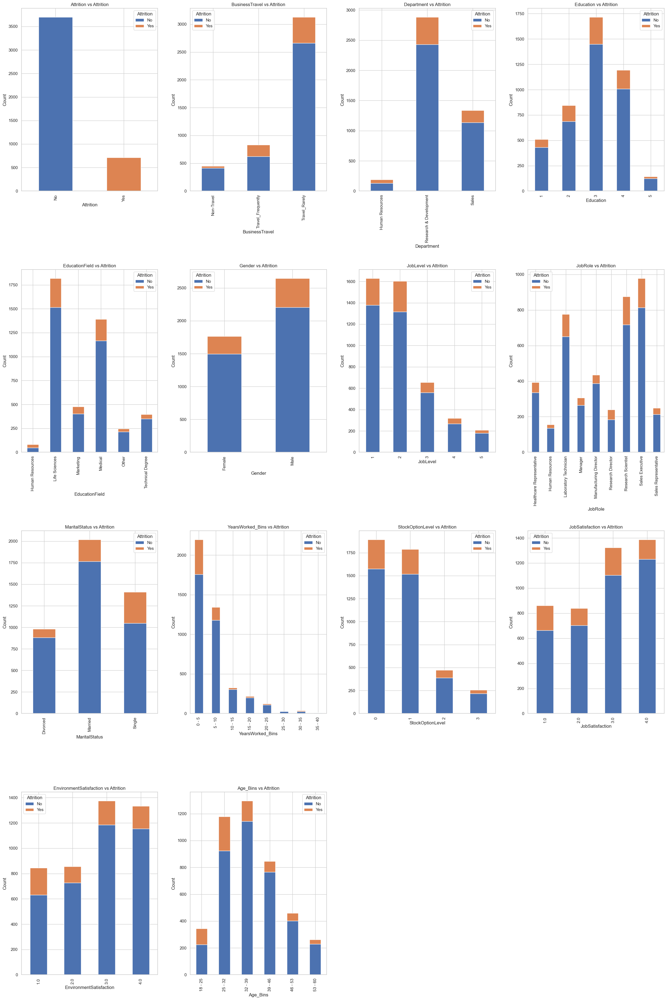

In [1639]:
fig = plt.figure(figsize=(25,39))
for idx, i in enumerate(cat_col):
    crosstab = pd.crosstab(index=df[i], columns=df["Attrition"])
    ax = plt.subplot(4, 4, idx + 1)
    crosstab.plot(kind="bar", stacked=True, ax=ax)
    ax.set_xlabel(i)
    ax.set_ylabel('Count')
    ax.set_title(f'{i} vs Attrition', fontsize=12)

plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.95])
plt.show()

### Percentage Distribution of Attrition Across Categorical Variables 

In [1641]:
cat_col2 = ['BusinessTravel', 'Department','Education','EducationField', 'Gender', 
           'JobLevel', 'JobRole', 'MaritalStatus',"YearsWorked_Bins","StockOptionLevel","JobSatisfaction","EnvironmentSatisfaction","Age_Bins"]

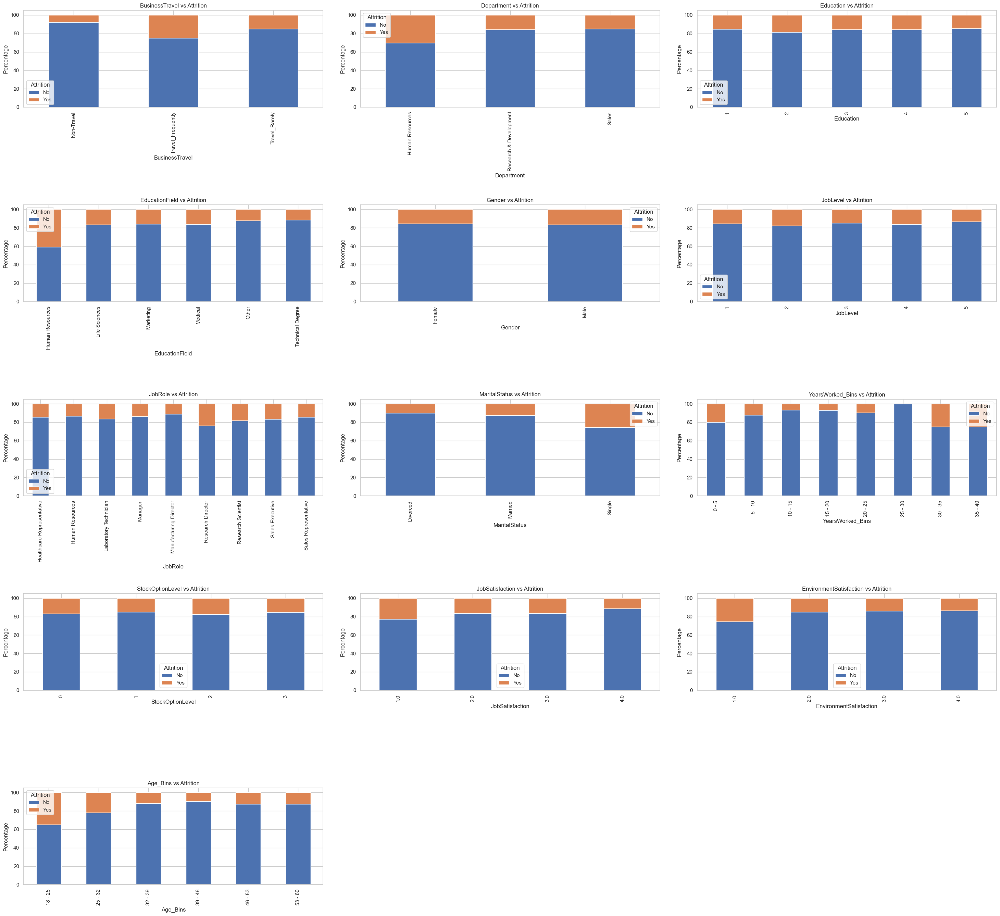

In [1645]:
fig, axes = plt.subplots(len(cat_col2) // 4+ 1, 4, figsize=(30,29))

for idx, col in enumerate(cat_col2):
    crosstab = pd.crosstab(index=df[col], columns=df["Attrition"], normalize='index') * 100
    ax=plt.subplot(5,3,idx+1)
    crosstab.plot(kind="bar", stacked=True, ax=ax)
    
    ax.set_xlabel(col)
    ax.set_ylabel('Percentage')
    ax.set_title(f'{col} vs Attrition')

# Remove empty subplots
for ax in axes.flatten():
    if not ax.has_data():
        fig.delaxes(ax)
plt.tight_layout(pad=3.0, rect=[0, 0, 1, 0.95])
plt.show()

- Employees who Travel Rarely have higher attrition rate than employees who travel a lot and those who doesn't travel at all.
- Research and Development Department have the highest attrition rate.
- Employees under age bracket of 18-25  have higher attrition rate.



### Column: NumberofCompaniesWorked in

- The value '1' is the most frequent, accounting for 35.3% of the dataset.
- Values '0', '1', and '3' together make up a significant portion of the dataset, comprising 59.3% (13.3% + 35.3% + 10.7%).
- Values '2.694830335' is an unusual observation, occurring 19 times (0.4% of the dataset).

Converting '2.694830335' to 3 as that value is not practically logical

In [1648]:
value_to_replace = 2.694830335
replacement_value = 3

In [1650]:
df['NumCompaniesWorked'] = df['NumCompaniesWorked'].replace(value_to_replace, replacement_value)


In [2544]:
df.columns

Index(['JobInvolvement', 'PerformanceRating', 'EnvironmentSatisfaction',
       'JobSatisfaction', 'WorkLifeBalance', 'Age', 'Attrition',
       'BusinessTravel', 'Department', 'DistanceFromHome', 'Education',
       'EducationField', 'Gender', 'JobLevel', 'JobRole', 'MaritalStatus',
       'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike',
       'StockOptionLevel', 'TrainingTimesLastYear', 'YearsAtCompany',
       'YearsSinceLastPromotion', 'YearsWithCurrManager', 'YearsWorked_Bins',
       'Age_Bins', 'MonthlyIncome_log'],
      dtype='object')

In [2550]:
!pip install openpyxl

In [2554]:
df.to_csv('Pheonix_viz.xlsx', index=False)

### Log Transformation

In [1656]:
log_transformer = FunctionTransformer(np.log1p)

In [1683]:
df['MonthlyIncome_log'] = np.log1p(df['MonthlyIncome'])

# Viewing the transformed data
print(df[['MonthlyIncome', 'MonthlyIncome_log']].head())

   MonthlyIncome  MonthlyIncome_log
0         131160          11.784181
1          41890          10.642826
2         193280          12.171900
3          83210          11.329135
4          23420          10.061388


In [1689]:
df3=df.copy()

## Converting Categorical columns to Numerical

In [1495]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 24 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   JobInvolvement           4410 non-null   int64   
 1   PerformanceRating        4410 non-null   int64   
 2   EnvironmentSatisfaction  4410 non-null   float64 
 3   JobSatisfaction          4410 non-null   float64 
 4   WorkLifeBalance          4410 non-null   float64 
 5   Age                      4410 non-null   int64   
 6   Attrition                4410 non-null   object  
 7   BusinessTravel           4410 non-null   object  
 8   Department               4410 non-null   object  
 9   DistanceFromHome         4410 non-null   int64   
 10  Education                4410 non-null   int64   
 11  EducationField           4410 non-null   object  
 12  Gender                   4410 non-null   object  
 13  JobLevel                 4410 non-null   int64   
 14  JobRole 

#### Converting Categorical columns to Numerical to find correlation or check for Multicollinearlity

In [1499]:
df_dummies=pd.get_dummies(df,drop_first=True)
df_dummies.sample(6)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,DistanceFromHome,Education,JobLevel,MonthlyIncome,...,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,YearsWorked_Bins_5 - 10,YearsWorked_Bins_10 - 15,YearsWorked_Bins_15 - 20,YearsWorked_Bins_20 - 25,YearsWorked_Bins_25 - 30,YearsWorked_Bins_30 - 35,YearsWorked_Bins_35 - 40
860,3,3,1.0,4.0,3.0,26,4,3,1,32940,...,False,True,False,False,False,False,False,False,False,False
3948,3,3,3.0,1.0,3.0,41,5,3,1,121690,...,True,False,False,False,False,False,False,False,False,False
662,3,3,3.0,2.0,4.0,34,14,4,3,88340,...,False,False,False,False,True,False,False,False,False,False
164,3,3,1.0,4.0,4.0,19,4,3,1,76440,...,False,False,True,False,False,False,False,False,False,False
4055,3,3,4.0,2.0,3.0,38,4,2,1,44440,...,False,False,False,False,False,True,False,False,False,False
2381,1,3,2.0,3.0,3.0,27,10,4,3,194190,...,False,True,False,False,False,False,False,False,False,False


In [1501]:
df_dummies= df_dummies.astype(int)
df_dummies.sample(5)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,DistanceFromHome,Education,JobLevel,MonthlyIncome,...,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,YearsWorked_Bins_5 - 10,YearsWorked_Bins_10 - 15,YearsWorked_Bins_15 - 20,YearsWorked_Bins_20 - 25,YearsWorked_Bins_25 - 30,YearsWorked_Bins_30 - 35,YearsWorked_Bins_35 - 40
948,3,4,4,4,3,26,18,2,1,108800,...,0,0,1,1,0,0,0,0,0,0
3929,4,3,1,3,3,31,3,2,3,77560,...,0,1,0,0,0,0,0,0,0,0
858,2,3,3,4,3,55,11,1,1,26930,...,0,1,0,0,0,0,0,0,0,1
4264,3,3,4,4,3,54,9,3,1,196130,...,0,0,1,0,0,0,0,0,0,0
1148,4,3,3,1,3,54,1,3,2,23620,...,0,0,1,0,0,0,0,0,0,0


In [1503]:
df_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 44 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   JobInvolvement                     4410 non-null   int32
 1   PerformanceRating                  4410 non-null   int32
 2   EnvironmentSatisfaction            4410 non-null   int32
 3   JobSatisfaction                    4410 non-null   int32
 4   WorkLifeBalance                    4410 non-null   int32
 5   Age                                4410 non-null   int32
 6   DistanceFromHome                   4410 non-null   int32
 7   Education                          4410 non-null   int32
 8   JobLevel                           4410 non-null   int32
 9   MonthlyIncome                      4410 non-null   int32
 10  NumCompaniesWorked                 4410 non-null   int32
 11  PercentSalaryHike                  4410 non-null   int32
 12  StockOptionLevel    

## Visualization
#### Checking for Correlation

<Axes: >

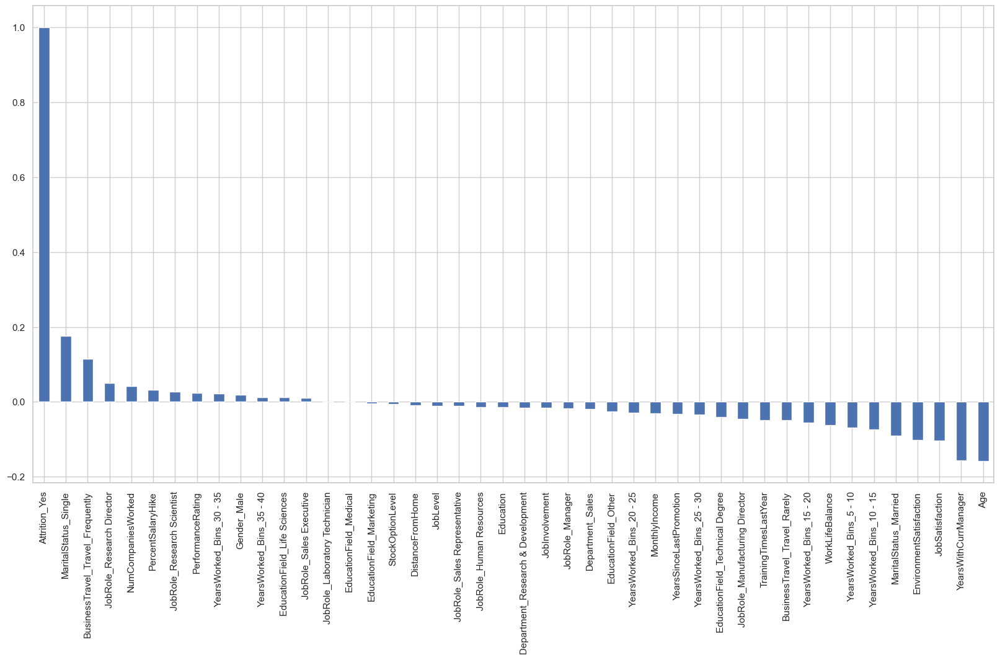

In [1505]:
plt.figure(figsize=(20,10))
df_dummies.corr()["Attrition_Yes"].sort_values(ascending = False).plot(kind="bar")          

Most Likely to churn:
- Single Employees
- Employees who Travel Frequently
- Job Role: Research Director, Research Scientist

None of the Features show a strong correlation with the Target variable : Attrition

#### Check for Multicolinearity

<Axes: >

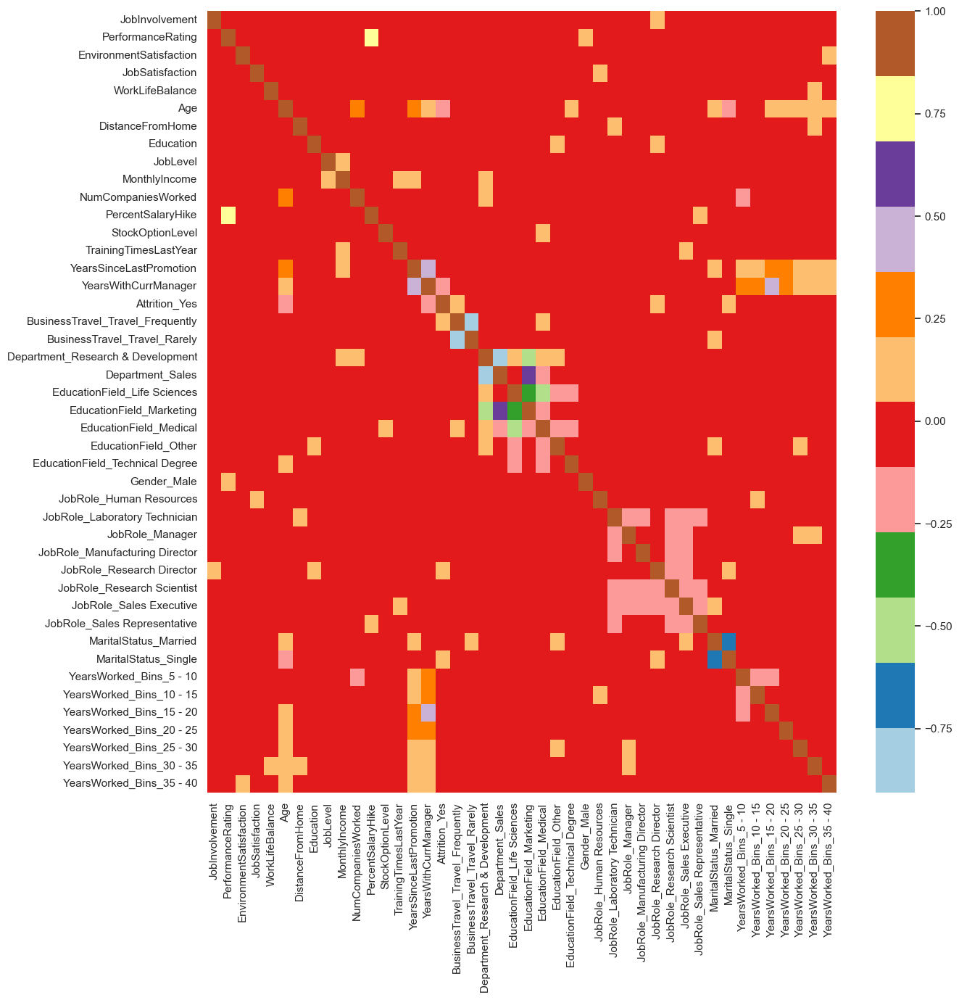

In [1511]:
plt.figure(figsize=(14,14))
sns.heatmap(df_dummies.corr(), cmap="Paired")

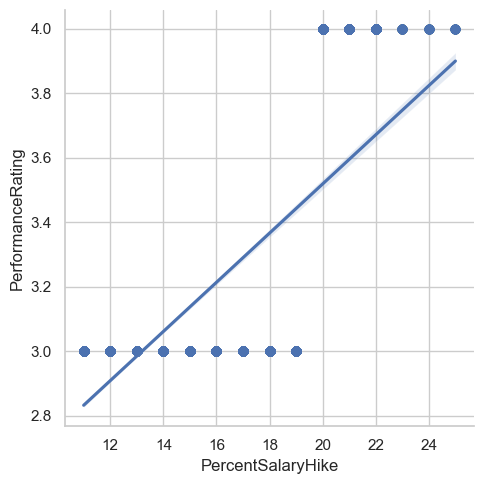

In [1209]:
sns.lmplot(data= df_dummies , x= "PercentSalaryHike" ,y = "PerformanceRating")

In [1211]:
df_dummies['PercentSalaryHike'].corr(df_dummies['PerformanceRating'])

0.7735499964012678

- There is a positive linear relationship between the two variables. As one variable increases, the other variable also increases.
-  As Percentage salary hike has little higher correlation with Attrition , we will drop PerformanceRating column

## Preparing Data for Model Training

In [1691]:
df.sample(2)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,YearsWorked_Bins,Age_Bins,MonthlyIncome_log
2560,3,3,1.0,1.0,3.0,40,No,Travel_Rarely,Research & Development,3,...,2.0,13,0,3,19,11,16,15 - 20,39 - 46,11.132119
3630,2,3,2.0,1.0,3.0,30,No,Travel_Rarely,Research & Development,6,...,1.0,11,1,2,9,0,8,5 - 10,25 - 32,10.322560


### One Hot Encoding

In [2450]:
X_Dummies = pd.get_dummies(df[['BusinessTravel', 'Department','EducationField', 
                                 'Gender', 'JobRole', 'MaritalStatus']])
X_Dummies.head()

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,False,False,True,False,False,True,False,True,False,False,...,False,False,False,False,False,False,False,False,True,False
1,False,True,False,False,True,False,False,True,False,False,...,False,False,False,False,True,False,False,False,False,True
2,False,True,False,False,True,False,False,False,False,False,...,False,False,False,False,False,True,False,False,True,False
3,True,False,False,False,True,False,False,True,False,False,...,False,False,False,False,False,False,False,False,True,False
4,False,False,True,False,True,False,False,False,False,True,...,False,False,False,False,False,True,False,False,False,True


In [2452]:
X_Dummies= X_Dummies.astype(int)
X_Dummies

,BusinessTravel_Non-Travel,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
0,0,0,1,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
1,0,1,0,0,1,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,1
2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0
3,1,0,0,0,1,0,0,1,0,0,...,0,0,0,0,0,0,0,0,1,0
4,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4405,0,0,1,0,1,0,0,0,0,1,...,0,0,0,0,1,0,0,0,0,1
4406,0,0,1,0,1,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
4407,0,0,1,0,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,1,0
4408,0,0,1,0,0,1,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0


In [2454]:
df_final = pd.concat([df,X_Dummies],axis=1)
df_final.sample(5)

,JobInvolvement,PerformanceRating,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,BusinessTravel,Department,DistanceFromHome,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
3922,2,3,4.0,4.0,3.0,39,No,Non-Travel,Research & Development,3,...,0,0,1,0,0,0,0,0,1,0
957,3,3,1.0,4.0,4.0,35,No,Travel_Frequently,Research & Development,13,...,0,0,0,0,0,1,0,0,0,1
3646,4,3,3.0,1.0,4.0,34,No,Travel_Rarely,Sales,4,...,0,0,0,0,1,0,0,0,0,1
2000,4,3,3.0,3.0,4.0,28,No,Travel_Rarely,Research & Development,1,...,0,0,0,0,0,0,0,0,0,1
622,3,3,3.0,2.0,3.0,32,No,Travel_Frequently,Sales,10,...,0,0,0,0,0,1,0,0,1,0


In [2244]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 47 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   JobInvolvement                     4410 non-null   int64   
 1   PerformanceRating                  4410 non-null   int64   
 2   EnvironmentSatisfaction            4410 non-null   float64 
 3   JobSatisfaction                    4410 non-null   float64 
 4   WorkLifeBalance                    4410 non-null   float64 
 5   Age                                4410 non-null   int64   
 6   Attrition                          4410 non-null   object  
 7   BusinessTravel                     4410 non-null   object  
 8   Department                         4410 non-null   object  
 9   DistanceFromHome                   4410 non-null   int64   
 10  Education                          4410 non-null   int64   
 11  EducationField                     4410 non

In [2456]:
df_final = df_final.drop(["PerformanceRating",'BusinessTravel', 'Department','EducationField', 
                                 'Gender', 'JobRole', 'MaritalStatus',"YearsWorked_Bins","Age_Bins","MonthlyIncome"],axis=1)

In [2458]:
df_final['Attrition'] = df_final['Attrition'].replace({'Yes': 1, 'No': 0})

In [2385]:
df_final.sample(5)

,JobInvolvement,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,Age,Attrition,DistanceFromHome,Education,JobLevel,NumCompaniesWorked,...,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single
1951,3,1.0,4.0,3.0,27,0,3,3,2,0.0,...,0,0,0,0,0,0,0,0,1,0
237,3,3.0,1.0,3.0,27,1,27,3,2,0.0,...,0,0,0,0,1,0,0,1,0,0
261,2,2.0,4.0,3.0,29,0,2,4,4,1.0,...,0,0,0,0,0,0,0,1,0,0
2700,3,1.0,4.0,3.0,53,0,11,3,2,2.0,...,0,1,0,0,0,0,0,0,1,0
710,3,1.0,1.0,2.0,36,0,16,2,1,2.0,...,0,0,0,0,1,0,0,0,1,0


<Axes: >

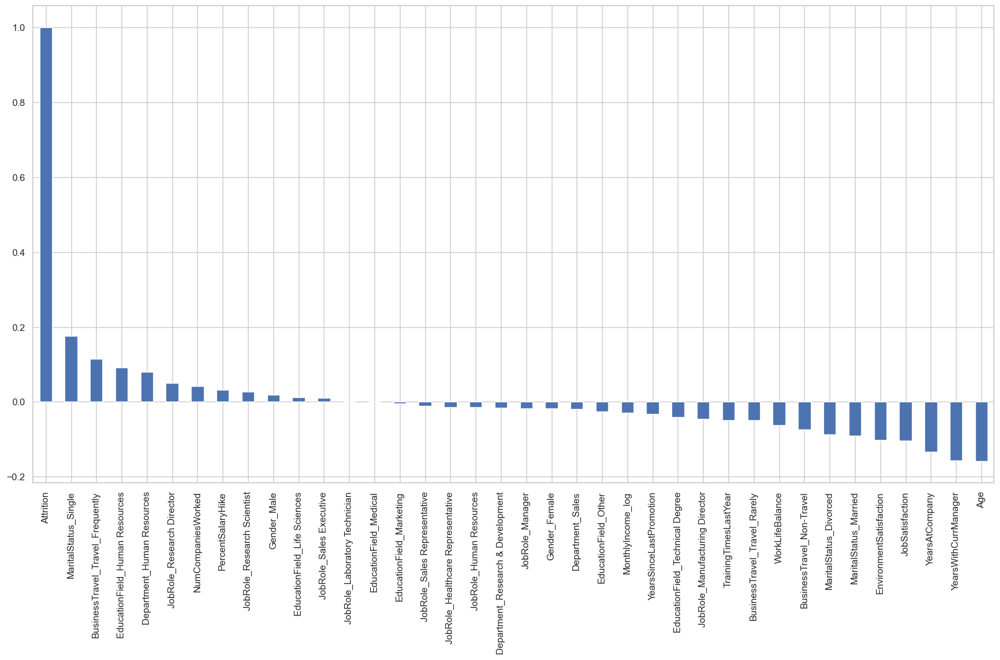

In [2393]:
plt.figure(figsize=(20,10))
df_final.corr()["Attrition"].sort_values(ascending = False).plot(kind="bar")  

In [2460]:
df_final.drop(columns=["StockOptionLevel","DistanceFromHome","JobLevel"],inplace=True) 

In [2462]:
df_final.drop(columns=["Education","JobInvolvement"],inplace=True)

In [2391]:
df_final.columns

Index(['EnvironmentSatisfaction', 'JobSatisfaction', 'WorkLifeBalance', 'Age',
       'Attrition', 'NumCompaniesWorked', 'PercentSalaryHike',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion',
       'YearsWithCurrManager', 'MonthlyIncome_log',
       'BusinessTravel_Non-Travel', 'BusinessTravel_Travel_Frequently',
       'BusinessTravel_Travel_Rarely', 'Department_Human Resources',
       'Department_Research & Development', 'Department_Sales',
       'EducationField_Human Resources', 'EducationField_Life Sciences',
       'EducationField_Marketing', 'EducationField_Medical',
       'EducationField_Other', 'EducationField_Technical Degree',
       'Gender_Female', 'Gender_Male', 'JobRole_Healthcare Representative',
       'JobRole_Human Resources', 'JobRole_Laboratory Technician',
       'JobRole_Manager', 'JobRole_Manufacturing Director',
       'JobRole_Research Director', 'JobRole_Research Scientist',
       'JobRole_Sales Executive', 'JobRole_Sales Repres

df_final.drop(columns=["Gender_Male","Gender_Female"],inplace= True)

## Train-Test Split

In [2464]:
from sklearn.model_selection import train_test_split

In [2466]:
X = df_final.drop(columns=["Attrition"])
y = df_final["Attrition"]

In [2468]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=66)

## SMOTE

In [2477]:

from collections import Counter
from imblearn.over_sampling import SMOTE
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2479]:
# summarize class distribution
print("Before oversampling: ",Counter(y_train))

SMOTE = SMOTE()

# fit and apply the transform
X_train_SMOTE, y_train_SMOTE = SMOTE.fit_resample(X_train_scaled, y_train)

# summarize class distribution
print("After oversampling: ",Counter(y_train_SMOTE))

Before oversampling:  Counter({0: 2601, 1: 486})
After oversampling:  Counter({0: 2601, 1: 2601})


# Standarization

In [2470]:
import pandas as pd
from sklearn.preprocessing import StandardScaler

In [2472]:
stdscaler=StandardScaler()
X_train_scaled= stdscaler.fit_transform(X_train)
print(X_train_scaled)

[[ 1.19280667  0.24044353  1.76964837 ... -0.52599899  1.0750471
  -0.68505499]
 [ 1.19280667  1.14783863 -1.06527873 ... -0.52599899 -0.93019181
   1.45973684]
 [-1.58970783  0.24044353 -1.06527873 ... -0.52599899  1.0750471
  -0.68505499]
 ...
 [-1.58970783 -1.57434666 -1.06527873 ... -0.52599899  1.0750471
  -0.68505499]
 [ 0.26530184  1.14783863  0.35218482 ... -0.52599899 -0.93019181
   1.45973684]
 [-0.662203    0.24044353  1.76964837 ... -0.52599899  1.0750471
  -0.68505499]]


In [2474]:
X_test_scaled = stdscaler.transform(X_test)

- Training set : X_train_scaled, y_train_SMOTE
- Test set : X_test_scaled , y_test

# Model 

### Logistic Regression

In [2481]:
# Fitting Multiple Logistic Regression to the Training set
from sklearn.linear_model import LogisticRegression
classifier = LogisticRegression()
classifier.fit(X_train_SMOTE, y_train_SMOTE)

LogisticRegression()

In [2483]:
y_pred = classifier.predict(X_test_scaled)

In [2485]:
y_pred

array([0, 1, 0, ..., 0, 0, 0], dtype=int64)

In [2487]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
confusion_matrix(y_test, y_pred)


array([[800, 298],
       [ 74, 151]], dtype=int64)

In [2489]:
print('recall:', recall_score(y_test, y_pred))
print('f1-score:', f1_score(y_test, y_pred))
print('precision:', precision_score(y_test, y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))

recall: 0.6711111111111111
f1-score: 0.4480712166172107
precision: 0.3363028953229399
accuracy: 0.7188208616780045


82.08% accuracy is reasonably good, but it's essential to consider the balance between precision and recall, especially in imbalanced datasets.

In [2122]:
y_pred_proba = classifier.predict_proba(X_test_scaled)
y_pred_proba 

array([[0.65919456, 0.34080544],
       [0.38488091, 0.61511909],
       [0.60993872, 0.39006128],
       ...,
       [0.68309302, 0.31690698],
       [0.77965819, 0.22034181],
       [0.92530931, 0.07469069]])

In [2124]:
roc_auc_lr= roc_auc_score(y_test, y_pred_proba[:,1])
roc_auc_lr

0.7709046751669703

### ROC AUC Curve

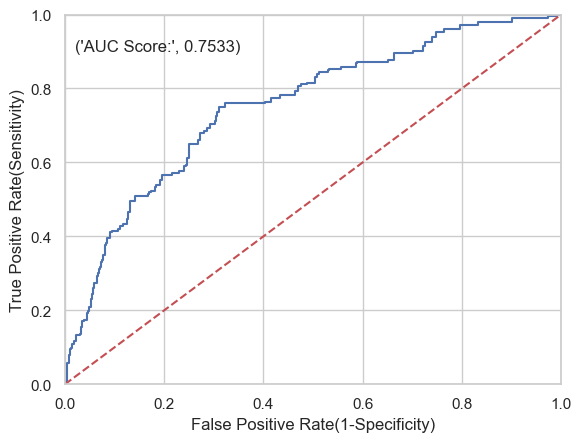

In [1781]:
fpr,tpr,threshold = roc_curve(y_test,y_pred_proba[:,1])
plt.plot(fpr,tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0,1],[0,1],'r--')
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_pred_proba[:,1]),4)))
plt.xlabel('False Positive Rate(1-Specificity)',fontsize=12)
plt.ylabel('True Positive Rate(Sensitivity)',fontsize=12)
plt.show()

### Confusion Matric : LogisticRegression

In [1263]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
confusion_matrix = confusion_matrix(y_test, y_pred)

In [1265]:
confusion_matrix

array([[1076,   39],
       [ 175,   33]], dtype=int64)

In [1267]:
print('recall:', recall_score(y_test, y_pred))
print('f1-score:', f1_score(y_test, y_pred))
print('precision:', precision_score(y_test, y_pred))
print('accuracy:', accuracy_score(y_test, y_pred))

recall: 0.15865384615384615
f1-score: 0.23571428571428568
precision: 0.4583333333333333
accuracy: 0.8382464096749811


In [617]:
from sklearn.metrics import classification_report
print("=======================================================================\n")
print(classification_report(y_test, y_pred))
print("=======================================================================\n")
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(classifier.score(X_test_scaled, y_test)))


              precision    recall  f1-score   support

           0       0.86      0.97      0.91      1115
           1       0.48      0.15      0.23       208

    accuracy                           0.84      1323
   macro avg       0.67      0.56      0.57      1323
weighted avg       0.80      0.84      0.80      1323


Accuracy of logistic regression classifier on test set: 0.84


In [619]:
from sklearn.metrics import mean_squared_error

In [621]:
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("RMSE: %f" % (rmse))

RMSE: 0.399357


### ROC-AUC curve


In [623]:
from sklearn.metrics import roc_curve, auc,roc_auc_score

In [625]:
y_pred_proba =classifier.predict_proba(X_test_scaled)
roc_auc_logistic = roc_auc_score(y_test, y_pred_proba[:,1])
roc_auc_logistic


0.75864953432218

In [339]:
fpr,tpr,threshold = roc_curve(y_test, y_pred_proba[:,1])

In [341]:
fpr, tpr, threshold = roc_curve(y_test, classifier.predict_proba(X_test_scaled)[:,1])

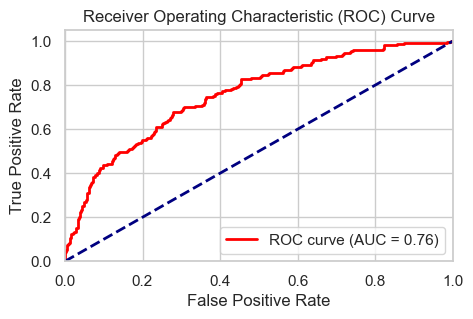

In [343]:
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(5, 3))
plt.plot(fpr, tpr, color='red', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--') # diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

## Decision Tree Classifier

In [2126]:
from sklearn.tree import DecisionTreeClassifier

In [2128]:
dtc = DecisionTreeClassifier()

dtc.fit(X_train_SMOTE, y_train_SMOTE)
dt_pred = dtc.predict(X_test_scaled)

In [2130]:
print('recall:', recall_score(y_test, dt_pred))
print('f1-score:', f1_score(y_test, dt_pred))
print('precision:', precision_score(y_test, dt_pred))
print('accuracy:', accuracy_score(y_test, dt_pred))

recall: 0.9022222222222223
f1-score: 0.9042316258351893
precision: 0.90625
accuracy: 0.9674981103552532


In [2132]:
from sklearn.metrics import confusion_matrix
confusion_matrix = confusion_matrix(y_test, dt_pred)

In [2134]:
confusion_matrix

array([[1077,   21],
       [  22,  203]], dtype=int64)

#### Predicting using Training set

In [2136]:
dt_pred2 = dtc.predict(X_train_SMOTE)

In [2138]:
print('accuracy:', accuracy_score(y_train_SMOTE, dt_pred2))
print('recall:', recall_score(y_train_SMOTE, dt_pred2))
print('f1-score:', f1_score(y_train_SMOTE, dt_pred2))
print('precision:', precision_score(y_train_SMOTE, dt_pred2))

accuracy: 1.0
recall: 1.0
f1-score: 1.0
precision: 1.0


DecisionTree Classifier is showing signs of Overfitting.
- Achieving perfect scores (1.0) on recall, F1-score, and precision on training data usually indicates overfitting. The model has memorized the training data rather than learning to generalize from it.

#### Cross Validation

In [1313]:
from sklearn.model_selection import cross_val_score

In [1891]:
np.mean(cross_val_score(dtc,X_test_scaled,y_test,scoring="accuracy",cv=20))

0.8828132066938036

In [1893]:
y_pred_proba = dtc.predict_proba(X_test_scaled)

In [1895]:
roc_auc_dtc = roc_auc_score(y_test, y_pred_proba[:,1])
roc_auc_dtc

0.945071158059202

## KNN 

In [2519]:
from sklearn.neighbors import KNeighborsClassifier

In [2521]:
knn = KNeighborsClassifier()
knn_model =knn.fit(X_train_SMOTE,y_train_SMOTE)
y_pred_knn=knn_model.predict(X_test_scaled)

In [2523]:
# calculate the accuracy
accuracy_knn=accuracy_score(y_test,y_pred_knn)
accuracy_knn

0.8314436885865457

In [2525]:
print('recall:', recall_score(y_test, y_pred_knn))
print('f1-score:', f1_score(y_test, y_pred_knn))
print('precision:', precision_score(y_test, y_pred_knn))

recall: 0.9022222222222223
f1-score: 0.6454689984101749
precision: 0.5024752475247525


In [2527]:
y_pred_proba = knn_model.predict_proba(X_test_scaled)
roc_auc_naive_bayes = roc_auc_score(y_test, y_pred_proba[:,1])
roc_auc_naive_bayes

0.9352357822303178

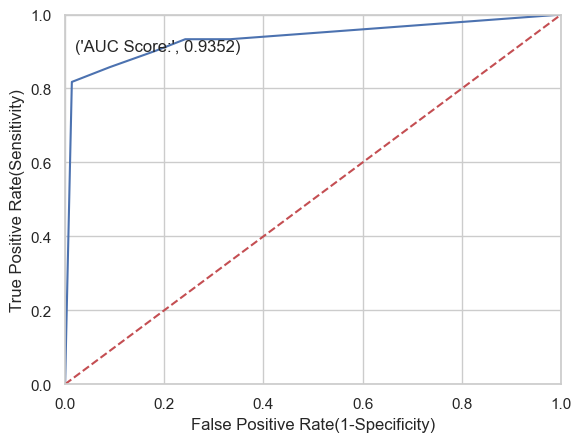

In [2529]:
fpr,tpr,threshold = roc_curve(y_test,y_pred_proba[:,1])
plt.plot(fpr,tpr)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.plot([0,1],[0,1],'r--')
plt.text(x = 0.02, y = 0.9, s = ('AUC Score:', round(metrics.roc_auc_score(y_test, y_pred_proba[:,1]),4)))
plt.xlabel('False Positive Rate(1-Specificity)',fontsize=12)
plt.ylabel('True Positive Rate(Sensitivity)',fontsize=12)
plt.show()

# Random Forrest classifier

In [2582]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier

In [2584]:
param_distributions = {
    'n_estimators': np.arange(100, 1001, 100),  
    'criterion': ['gini', 'entropy'],          
    'max_depth': [None, 5, 10, 15, 20],        
    'min_samples_split': np.arange(2, 11),      
    'min_samples_leaf': np.arange(1, 11),}

In [2586]:
rf = RandomForestClassifier()

In [2588]:
random_search = RandomizedSearchCV(rf, param_distributions, n_iter=10, cv=5)
random_search.fit(X_train_SMOTE, y_train_SMOTE)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 5, 10, 15, 20],
                                        'min_samples_leaf': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': array([ 100,  200,  300,  400,  500,  600,  700,  800,  900, 1000])})

In [2589]:
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best hyperparameters:", best_params)
print("Best model:", best_model)

Best hyperparameters: {'n_estimators': 500, 'min_samples_split': 9, 'min_samples_leaf': 3, 'max_depth': 20, 'criterion': 'entropy'}
Best model: RandomForestClassifier(criterion='entropy', max_depth=20, min_samples_leaf=3,
                       min_samples_split=9, n_estimators=500)


In [2590]:
best_params = random_search.best_params_
best_model = RandomForestClassifier(**best_params)  # Create a new instance with best params
best_model.fit(X_train_SMOTE, y_train_SMOTE)  

RandomForestClassifier(criterion='entropy', max_depth=20, min_samples_leaf=3,
                       min_samples_split=9, n_estimators=500)

In [2591]:
# Predicting

In [2503]:
y_pred_rf = best_model.predict(X_test_scaled)

In [2505]:
accuracy = accuracy_score(y_test, y_pred_rf)
print("Test set accuracy:", accuracy)
print('recall:', recall_score(y_test, y_pred_rf))
print('f1-score:', f1_score(y_test, y_pred_rf))
print('precision:', precision_score(y_test, y_pred_rf))

Test set accuracy: 0.9727891156462585
recall: 0.8533333333333334
f1-score: 0.9142857142857143
precision: 0.9846153846153847


In [2507]:
#Training Dataset
y_predrf2=best_model.predict(X_train_SMOTE)

In [2509]:
accuracy_rf=accuracy_score(y_train_SMOTE,y_predrf2)
print("Training dataset accuracy:",accuracy_rf)

Training dataset accuracy: 0.9992310649750096


In [2511]:
print('recall:', recall_score(y_train_SMOTE, y_predrf2))
print('f1-score:', f1_score(y_train_SMOTE, y_predrf2))
print('precision:', precision_score(y_train_SMOTE, y_predrf2))

recall: 0.9984621299500193
f1-score: 0.9992304732589459
precision: 1.0


### ROC-AUC curve

In [2605]:
y_pred_proba = best_model.predict_proba(X_test_scaled)[:, 1]

In [2607]:
roc_auc_rf = roc_auc_score(y_test, y_pred_proba)
roc_auc_rf

0.9807528840315727

The ROC AUC score of 0.9867 indicates excellent model performance in distinguishing between the classes.

In [2610]:
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

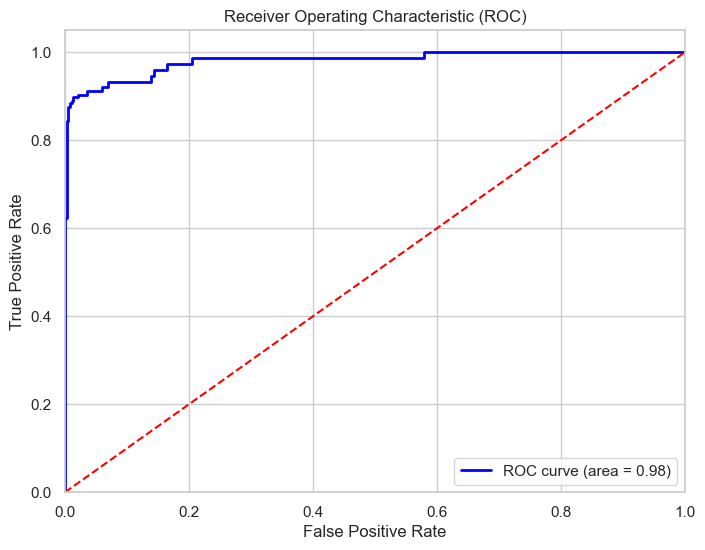

In [2612]:
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.show()

##  Recommendations based on Analysis:

- <u>Focus Areas for Retention Strategies</u>: Improve job involvement, enhance work-life balance initiatives, and address satisfaction metrics.
- <u>Departmental Focus</u>: HR department should prioritize retention strategies due to high attrition despite a small team.
    - HR departments often set policies and practices for employee retention and satisfaction. High attrition in HR could signal that these policies are not effective even for those who implement them.
- <u>Travel Policies</u>: Review policies to reduce attrition among employees who Travel frequently,reducing the times employees have to travel for buisness, can effectively reduce attrition by 10%.
- <u>Education and Job Role</u>: Provide career development and satisfaction initiatives tailored to high-risk roles like Research Directors.
- Employees who <u>didn't get promoted since last 5 years</u> have higher risk of attrition.